In [1]:
import numpy as np
def generate_weighted_watts_strogatz_numpy(num_nodes, k_neighbors, p_rewire, seed=None):
    """
    Generates the weighted adjacency matrix for a Watts-Strogatz (Small-World) graph 
    where edge weights are uniformly distributed between 0 and 1.

    Args:
        num_nodes (int): The total number of nodes (N).
    
        k_neighbors (int): The number of neighbors each node connects to in the 
                           initial ring lattice (k, must be even).
        p_rewire (float): The probability of rewiring an edge (p), between 0 and 1.
        seed (int, optional): Seed for reproducibility.

    Returns:
        np.ndarray: The symmetric weighted adjacency matrix (float dtype).
    """
    if seed is not None:
        np.random.seed(seed)
    
    if k_neighbors % 2 != 0:
        raise ValueError("k_neighbors must be an even integer.")
        
    # Use float for weights
    adj_matrix = np.zeros((num_nodes, num_nodes), dtype=float)
    half_k = k_neighbors // 2
    
    # 1. Create the initial Weighted Ring Lattice
    for i in range(num_nodes):
        for j in range(1, half_k + 1):
            
            neighbor_right = (i + j) % num_nodes
            neighbor_left = (i - j) % num_nodes
            
            # Generate a random weight for the new edge (between 0 and 1)
            new_weight = np.random.uniform(0.1, 1.0) # Start weights slightly above 0 to differentiate from non-edges
            
            # Connect to the right neighbor
            if i != neighbor_right and adj_matrix[i, neighbor_right] == 0:
                adj_matrix[i, neighbor_right] = new_weight
                adj_matrix[neighbor_right, i] = new_weight # Symmetric
            
            # Connect to the left neighbor
            if i != neighbor_left and adj_matrix[i, neighbor_left] == 0:
                adj_matrix[i, neighbor_left] = new_weight
                adj_matrix[neighbor_left, i] = new_weight # Symmetric

    # 2. Randomly Rewire Edges
    
    # Iterate over upper triangular unique edges
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            # Check if an edge exists (weight > 0)
            if adj_matrix[i, j] > 0:
                
                if np.random.rand() < p_rewire:
                    
                    # a. Remove the existing edge (set weight to 0)
                    adj_matrix[i, j] = 0.0
                    adj_matrix[j, i] = 0.0
                    
                    # b. Find a new node 'w' to connect to
                    new_neighbor = i
                    # Keep trying until a new node is found that isn't i and isn't already connected
                    while new_neighbor == i or adj_matrix[i, new_neighbor] > 0:
                        new_neighbor = np.random.randint(0, num_nodes)
                        
                    # Generate a random weight for the new edge (between 0 and 1)
                    new_weight = np.random.uniform(0.1, 1.0)
                        
                    # c. Add the new edge (i, new_neighbor) with the new weight
                    adj_matrix[i, new_neighbor] = new_weight
                    adj_matrix[new_neighbor, i] = new_weight # Symmetric

    return adj_matrix

In [1]:
import numpy as np
import torch 
import networkx as nx

datasetPath = "data/France/transportsIDF/"

def read_matrix_from_csv_loadtxt(filepath, delimiter=',', dtype=float):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter, dtype=dtype)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None

p_vectors_array = read_matrix_from_csv_loadtxt(datasetPath + "idf_attr_nnorm.csv")
adjacency_matrix = read_matrix_from_csv_loadtxt(datasetPath + "idf_adjacency_nnorm.csv")
names = read_matrix_from_csv_loadtxt(datasetPath + "idf_names_nnorm.csv", dtype=str)

# random_weights = np.random.normal(loc=0, scale=1, size=(50, 50))
# symmetric_matrix = random_weights + random_weights.T
# np.fill_diagonal(symmetric_matrix, 0)
# symmetric_matrix /= np.max(symmetric_matrix)
# symmetric_matrix = np.abs(symmetric_matrix)
# symmetric_matrix = np.where(symmetric_matrix < 0.15, 0.0, symmetric_matrix)
# adjacency_matrix = symmetric_matrix

# adjacency_matrix= generate_weighted_watts_strogatz_numpy(num_nodes=50, 
#                                                 k_neighbors=4, 
#                                                 p_rewire=0.1, 
#                                                 seed=42)
# p_vectors_array = p_vectors_array[0:50, :]
# names = names[0:50]


num_nodes = adjacency_matrix.shape[0]
dimP = 20

G = nx.from_numpy_array(adjacency_matrix)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops

Successfully loaded matrix from data/France/transportsIDF/idf_attr_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_adjacency_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_names_nnorm.csv using np.loadtxt().


In [2]:
from scipy.spatial.distance import cosine # For cosine similarity

def compute_node_feature_assortativity(G, node_features):
    """
    Computes a node-level assortativity-like score based on d-dimensional features.
    For each node, it calculates the average similarity to its neighbors
    and compares it to the average similarity to all other nodes.

    Args:
        adj_matrix (np.ndarray): The adjacency matrix of the graph (N x N).
        node_features (np.ndarray): A (N x D) array where N is the number of nodes
                                     and D is the dimensionality of features.

    Returns:
        dict: A dictionary where keys are node IDs (integers) and values are
              their respective node-level assortativity scores.
              A higher positive score indicates more assortative mixing for that node.
              A negative score indicates disassortative mixing for that node.
    """
    num_nodes = G.number_of_nodes()
    if node_features.shape[0] != num_nodes:
        raise ValueError("Number of nodes in adjacency matrix and features must match.")

    # 1. Create a NetworkX graph from the adjacency matrix

    # Add features to nodes
    for i in range(num_nodes):
        G.nodes[i]['features'] = node_features[i]

    def vector_similarity(vec1, vec2):
        # Handle cases where vectors might be identical to avoid cosine(0,0) issues
        if np.array_equal(vec1, vec2):
            return 1.0
        return 1 - cosine(vec1, vec2)

    node_assortativity_scores = {}

    for node_id in G.nodes():
        node_feat = G.nodes[node_id]['features']
        neighbors = list(G.neighbors(node_id))

        if not neighbors:
            # A node with no neighbors can't have neighbor similarity
            node_assortativity_scores[node_id] = 0.0 # Or np.nan, depending on desired behavior
            continue

        # Calculate average similarity to neighbors
        neighbor_similarities = []
        for neighbor_id in neighbors:
            neighbor_feat = G.nodes[neighbor_id]['features']
            neighbor_similarities.append(vector_similarity(node_feat, neighbor_feat))
        avg_neighbor_similarity = np.mean(neighbor_similarities)

        # Calculate average similarity to all other nodes (baseline)
        all_other_node_similarities = []
        for other_node_id in G.nodes():
            if other_node_id != node_id: # Don't compare a node to itself
                other_node_feat = G.nodes[other_node_id]['features']
                all_other_node_similarities.append(vector_similarity(node_feat, other_node_feat))

        if not all_other_node_similarities: # Should only happen with single node graphs
            baseline_avg_similarity = avg_neighbor_similarity # Fallback if no other nodes
        else:
            baseline_avg_similarity = np.mean(all_other_node_similarities)

        # Compute the node's assortativity score
        score = avg_neighbor_similarity - baseline_avg_similarity
        node_assortativity_scores[node_id] = score

    return node_assortativity_scores

print("--- Assortativity by node ---")
node_scores_1 = compute_node_feature_assortativity(G, p_vectors_array)
# for node, score in node_scores_1.items():
#     print(f"Node {node}: {score:.3f}")
# Expected: Nodes within clusters (0,1,2 and 3,4,5) should have positive scores.

print("\n" + "="*40 + "\n")

--- Assortativity by node ---




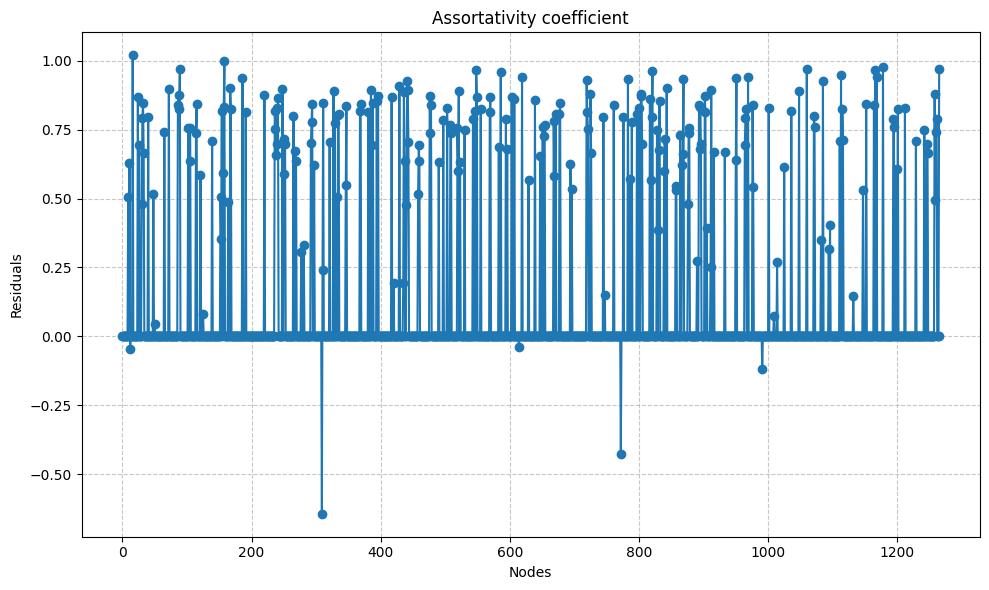

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.plot(node_scores_1.values(), marker='o', linestyle='-')

# Add a horizontal line at y=0

# --- Customize the Plot ---
plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Assortativity coefficient') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

In [4]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *

latent_dim = 2
input_dim = dimP
batch_size = 256


dataset = []
data = Data(x=torch.tensor(p_vectors_array, dtype=torch.float), 
            edge_index=adj_matrix_to_edge_index(adjacency_matrix)[0], 
            edge_labels=adj_matrix_to_edge_index(adjacency_matrix)[1],
            adjacency_matrix=torch.tensor(adjacency_matrix))
dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

In [5]:
dropout = 0
phase1_epochs = 1200
#phase1_epochs = 300
phase2_epochs = 500
#phase2_epochs = 100
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"


encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[96, 64],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ReLU()
)

node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[128],
    dropout=dropout,
    activation=nn.ReLU(),
    loss_options= {
        "lambda_comp_variance": 100,
        "lambda_decoder_variance":20,
        "debug": False},
    clip_var = 30,
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=1,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


In [6]:
import os

if os.path.exists("model_phase1_reducedIDF.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_reducedIDF.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_reducedIDF.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_19546/1371347935.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('mode

In [ ]:
# model_phase1.eval()

# with torch.no_grad():
#     x = single_graph.x.to(device)
#     edge_index = single_graph.edge_index.to(device)
#     latent_mu = model_phase1.encode(x, edge_index=edge_index)

# latent_points = latent_mu[0]

In [ ]:
# model_phase1.train_rbf_layer(
#     decoder_name="node_attr_decoder",
#     decoder_variance_target_name="node_features_logvar",
#     latent_samples=latent_points,
#     n_centers=24,  
#     a=2,
#     n_epochs= 20000,
#     lr=0.05,
#     force=True)

Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7370.09it/s]


Completed. Cached 10201 / 10201 points.


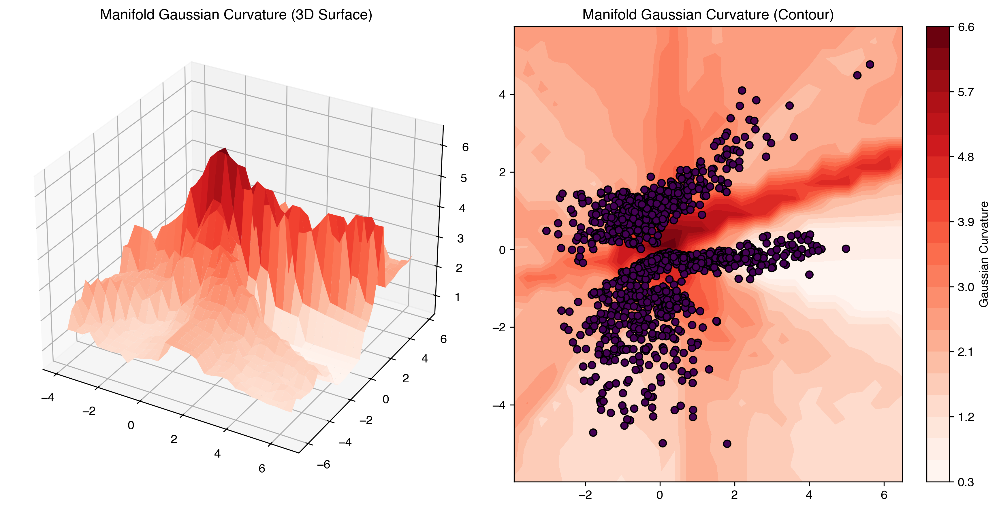

Calculating 800745 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 100094/100094 [00:15<00:00, 6594.27it/s]

Distance matrix calculation complete.


In [7]:
import copy
from framework.boundedManifold import BoundedManifold
from framework.torchVersions.distanceApproximations import DistanceApproximations
model_phase1 = model_phase1.to('cpu')
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points)

with torch.no_grad():
    dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                        DistanceApproximations.linear_interpolation_distance, 
                                                                                        batch_size=8, num_points=20)


In [ ]:
# def pointwise_RBF_variance(z: torch.Tensor) -> float:
#     return model_phase1.get_rbf_estimate(z.float()).sum()

# def pointwise_RBF_entropy(z: torch.Tensor) -> float:
#     logvar = -0.5 * torch.log(model_phase1.get_rbf_estimate(z.float()).sum())
#     return  0.5 * ((1 + np.log(2 * np.pi)) + logvar.sum())

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_variance, "Precision",
#                                                          data_points=latent_points, resolution=60)

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_entropy, "RBF Entropy",
#                                                          data_points=latent_points, resolution=60)

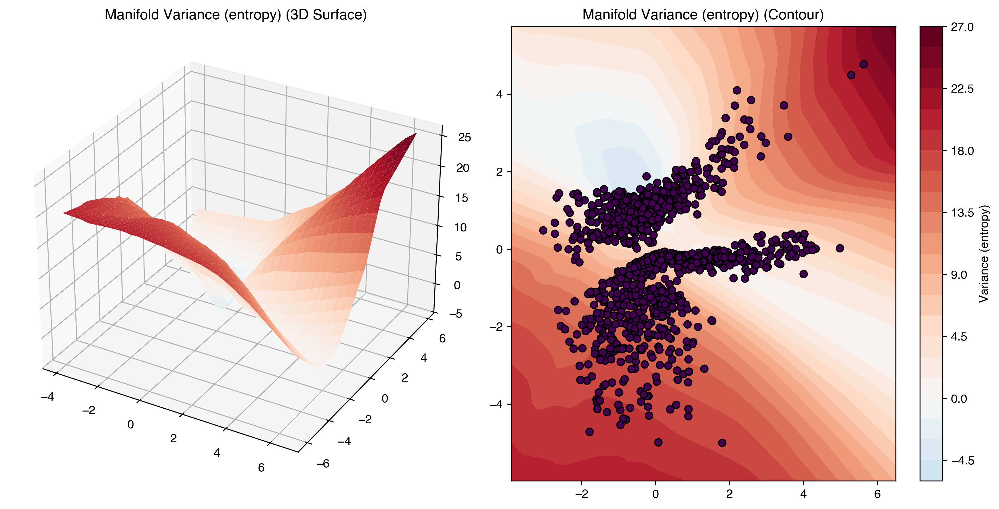

In [8]:
def pointwise_entropy(z: torch.Tensor) -> float:
    logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
    return  0.5 * (len(logvar) * (1 + np.log(2 * np.pi)) + logvar.sum())

# def pointwise_variance(z: torch.Tensor) -> float:
#     logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
#     return logvar.sum()

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_variance, "Variance (entropy)",
#                                                          data_points=latent_points, resolution=60)

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_entropy, "Variance (entropy)",
                                                         data_points=latent_points, resolution=60)

In [ ]:
# mse = torch.zeros(num_nodes)
# entropies = torch.zeros(num_nodes)

# for i in range(num_nodes):
#     mse[i] = ((recon[i]-single_graph.x[i])**2).sum()
#     entropies[i] = pointwise_entropy(latent_points[i])
# model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=mse)

In [ ]:
# k = 50
# topk_values, topk_indices = torch.topk(mse, k)
# names[topk_indices]

In [ ]:
# import statsmodels.api as sm
# x1 = single_graph.x[:, 10].flatten().numpy().reshape(-1, 1)
# x2 = entropies.detach().flatten().numpy().reshape(-1, 1)

# y = mse.flatten().detach().numpy()

# model = sm.OLS(x1,y)
# results = model.fit()
# print(results.summary())
# model = sm.OLS(x2,y)
# results = model.fit()
# print(results.summary())

In [ ]:
# i = int(np.random.random() * num_nodes)
# a = single_graph.x[i]
# a_r = model_phase1(single_graph.x[i].unsqueeze(0))


# colors = ['lightgray', 'red']
# from matplotlib.colors import ListedColormap
# cmap = ListedColormap(colors)

# fig = plt.figure(figsize=(18, 6))
# ax1 = fig.add_subplot(121)
# ax1.set_title(f'Recon test ({i} - {names[i]})')
# ax1.plot(a, marker='o', linestyle='-')
# ax1.plot(a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze(), marker='o', linestyle='-')
# ax1.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
# ax2 = fig.add_subplot(122)
# ax2.set_title(f'Points on Manifold')
# points_np = latent_points.detach().cpu().numpy()                
# labels_np = np.zeros(num_nodes)
# labels_np[i] = 1
# ax2.scatter(points_np[:, 0], points_np[:, 1], c=labels_np, cmap=cmap, edgecolors='k')
# plt.tight_layout()
# plt.show()

In [ ]:
# for j in range(20):
#     weights = [p_vectors_array[i, j] for i in range(num_nodes)]

#     # 4. Plot the distribution of the weights (Histogram)
#     plt.figure(figsize=(10, 6))

#     # Plot a histogram of the weights
#     # Use 'density=True' to show probability density instead of count
#     plt.hist(weights, bins=20, edgecolor='black', alpha=0.7, density=True)


#     # Add labels and title
#     plt.title(f'Distribution of Edge Weights - i={j}')
#     plt.xlabel('Weight Value')
#     plt.ylabel('Density')
#     plt.grid(axis='y', alpha=0.5)
#     plt.show()


In [9]:
from framework.KLAnnealingScheduler import NoKLScheduler

lr_phase2 = 0.001
distance_mode = "linear_interpolation" # "linear_interpolation"

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)

#torch.autograd.set_detect_anomaly(True)

distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    #heat_time=torch.logspace(start=-1, end=2, steps=10).tolist(),  # Adjust for local vs global structure
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    max_ema_epochs=phase2_epochs,
    #ema_lag_factor=0.1
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()

torch.nn.utils.clip_grad_norm_(model_phase2.parameters(), 1)
#torch.autograd.set_detect_anomaly(True)

# Phase 2 training
history_phase2 = train_phase2(
    model=model_phase2,
    data_loader=single_graph_list,
    latent_points=latent_points,
    num_epochs=phase2_epochs,
    lr=lr_phase2,
    weight_decay=1e-5,
#    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
    decoder_weights={"adj_decoder": 1, "node_attr_decoder":0.0 },
    verbose=True,
    device=device,
)

print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===



Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5684.55it/s]
/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:465: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  min_log = float(torch.log10(torch.tensor(t_min)).item()) if t_min > 0.0 else clamp_min_log
/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:466: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  max_log = float(torch.log10(torch.tensor(t_max)).item()) if t_max > 0.0 else clamp_max_log


Current sigma:  6.938845634460449 Selected sigma:  6.938845634460449
Selected heat times: tensor([4.5257e-02, 6.7873e-02, 1.0179e-01, 1.5266e-01, 2.2895e-01, 3.4337e-01,
        5.1497e-01, 7.7232e-01, 1.1583e+00, 1.7371e+00, 2.6052e+00, 3.9072e+00,
        5.8598e+00, 8.7882e+00, 1.3180e+01, 1.9767e+01, 2.9645e+01, 4.4460e+01,
        6.6678e+01, 1.0000e+02])
Current Laplacian loss: 4.290828 - With referent sigma: 4.290828


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5525.40it/s]


Current sigma:  6.831512451171875 Selected sigma:  6.9302592277526855
Current Laplacian loss: 4.280757 - With referent sigma: 4.280084


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5257.42it/s]


Current sigma:  6.721665382385254 Selected sigma:  6.913571834564209
Current Laplacian loss: 4.271725 - With referent sigma: 4.269868


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5355.51it/s]


Current sigma:  6.608841896057129 Selected sigma:  6.889193534851074
Current Laplacian loss: 4.263692 - With referent sigma: 4.260267


Computing distances in batches: 100%|██████████| 100094/100094 [00:20<00:00, 4990.59it/s]


Current sigma:  6.500393390655518 Selected sigma:  6.858089447021484
Current Laplacian loss: 4.256647 - With referent sigma: 4.251404


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5198.40it/s]


Current sigma:  6.39247465133667 Selected sigma:  6.820840358734131
Current Laplacian loss: 4.250356 - With referent sigma: 4.243135


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5318.91it/s]


Current sigma:  6.282504081726074 Selected sigma:  6.777773380279541
Current Laplacian loss: 4.244684 - With referent sigma: 4.235384


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5317.92it/s]


Current sigma:  6.186535835266113 Selected sigma:  6.730474472045898
Current Laplacian loss: 4.240314 - With referent sigma: 4.228854


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5225.03it/s]


Current sigma:  6.088720321655273 Selected sigma:  6.679134368896484
Current Laplacian loss: 4.236027 - With referent sigma: 4.222449


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5227.19it/s]


Current sigma:  5.992436408996582 Selected sigma:  6.6241984367370605
Current Laplacian loss: 4.232204 - With referent sigma: 4.216540
Phase 2 - Epoch 10/500 - Loss: 4.2322, KL: 0.0000 (weight: 0.0000), Adj: 4.2322, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5254.64it/s]


Current sigma:  5.896484851837158 Selected sigma:  6.565981388092041
Current Laplacian loss: 4.228740 - With referent sigma: 4.211037


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5139.60it/s]


Current sigma:  5.796425819396973 Selected sigma:  6.5044169425964355
Current Laplacian loss: 4.225482 - With referent sigma: 4.205824


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5463.29it/s]


Current sigma:  5.697906494140625 Selected sigma:  6.439896106719971
Current Laplacian loss: 4.222620 - With referent sigma: 4.201043


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5362.09it/s]


Current sigma:  5.601204872131348 Selected sigma:  6.372800827026367
Current Laplacian loss: 4.220231 - With referent sigma: 4.196751


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5416.50it/s]


Current sigma:  5.508959770202637 Selected sigma:  6.303693771362305
Current Laplacian loss: 4.218163 - With referent sigma: 4.192831


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5400.01it/s]


Current sigma:  5.423251628875732 Selected sigma:  6.2332587242126465
Current Laplacian loss: 4.216587 - With referent sigma: 4.189374


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5541.98it/s]


Current sigma:  5.333675384521484 Selected sigma:  6.16129207611084
Current Laplacian loss: 4.214916 - With referent sigma: 4.186006


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5459.03it/s]


Current sigma:  5.244384288787842 Selected sigma:  6.087939739227295
Current Laplacian loss: 4.213443 - With referent sigma: 4.182896


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5518.85it/s]


Current sigma:  5.165736675262451 Selected sigma:  6.014163494110107
Current Laplacian loss: 4.212464 - With referent sigma: 4.180215


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5533.28it/s]


Current sigma:  5.087068557739258 Selected sigma:  5.939995765686035
Current Laplacian loss: 4.211552 - With referent sigma: 4.177687
Phase 2 - Epoch 20/500 - Loss: 4.2116, KL: 0.0000 (weight: 0.0000), Adj: 4.2116, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5632.65it/s]


Current sigma:  5.016752243041992 Selected sigma:  5.866136074066162
Current Laplacian loss: 4.210967 - With referent sigma: 4.175456


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5657.28it/s]


Current sigma:  4.942413806915283 Selected sigma:  5.792238235473633
Current Laplacian loss: 4.210347 - With referent sigma: 4.173314


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5533.23it/s]


Current sigma:  4.871987819671631 Selected sigma:  5.718618392944336
Current Laplacian loss: 4.209805 - With referent sigma: 4.171327


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5514.94it/s]


Current sigma:  4.793840408325195 Selected sigma:  5.644636154174805
Current Laplacian loss: 4.209043 - With referent sigma: 4.169332


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5514.33it/s]


Current sigma:  4.726587772369385 Selected sigma:  5.571192264556885
Current Laplacian loss: 4.208675 - With referent sigma: 4.167600


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5550.32it/s]


Current sigma:  4.653384208679199 Selected sigma:  5.497767448425293
Current Laplacian loss: 4.207996 - With referent sigma: 4.165826


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5487.71it/s]


Current sigma:  4.597655773162842 Selected sigma:  5.4257588386535645
Current Laplacian loss: 4.208204 - With referent sigma: 4.164482


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5527.79it/s]


Current sigma:  4.53563117980957 Selected sigma:  5.354548931121826
Current Laplacian loss: 4.208158 - With referent sigma: 4.163139


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5502.34it/s]


Current sigma:  4.479781627655029 Selected sigma:  5.284567832946777
Current Laplacian loss: 4.208473 - With referent sigma: 4.162009


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5546.86it/s]


Current sigma:  4.419543266296387 Selected sigma:  5.215365886688232
Current Laplacian loss: 4.208425 - With referent sigma: 4.160809
Phase 2 - Epoch 30/500 - Loss: 4.2084, KL: 0.0000 (weight: 0.0000), Adj: 4.2084, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5579.04it/s]


Current sigma:  4.37119722366333 Selected sigma:  5.14783239364624
Current Laplacian loss: 4.208881 - With referent sigma: 4.159819


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5556.78it/s]


Current sigma:  4.322861194610596 Selected sigma:  5.08183479309082
Current Laplacian loss: 4.209180 - With referent sigma: 4.158828


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5577.88it/s]


Current sigma:  4.268887519836426 Selected sigma:  5.016798973083496
Current Laplacian loss: 4.209133 - With referent sigma: 4.157816


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5459.48it/s]


Current sigma:  4.206214427947998 Selected sigma:  4.9519524574279785
Current Laplacian loss: 4.208646 - With referent sigma: 4.156747


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5547.80it/s]


Current sigma:  4.1538872718811035 Selected sigma:  4.8881072998046875
Current Laplacian loss: 4.208662 - With referent sigma: 4.155850


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5514.36it/s]


Current sigma:  4.102870941162109 Selected sigma:  4.825288772583008
Current Laplacian loss: 4.208627 - With referent sigma: 4.154989


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5601.23it/s]


Current sigma:  4.058689117431641 Selected sigma:  4.763960838317871
Current Laplacian loss: 4.208908 - With referent sigma: 4.154254


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5504.62it/s]


Current sigma:  4.012919902801514 Selected sigma:  4.7038774490356445
Current Laplacian loss: 4.208970 - With referent sigma: 4.153511


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5572.03it/s]


Current sigma:  3.962752103805542 Selected sigma:  4.64458703994751
Current Laplacian loss: 4.209010 - With referent sigma: 4.152808


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5538.22it/s]


Current sigma:  3.919243812561035 Selected sigma:  4.586559772491455
Current Laplacian loss: 4.209147 - With referent sigma: 4.152171
Phase 2 - Epoch 40/500 - Loss: 4.2091, KL: 0.0000 (weight: 0.0000), Adj: 4.2091, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5445.02it/s]


Current sigma:  3.873093605041504 Selected sigma:  4.529482364654541
Current Laplacian loss: 4.209219 - With referent sigma: 4.151542


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5591.25it/s]


Current sigma:  3.8268160820007324 Selected sigma:  4.473268985748291
Current Laplacian loss: 4.209169 - With referent sigma: 4.150927


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5568.58it/s]


Current sigma:  3.782742738723755 Selected sigma:  4.418026924133301
Current Laplacian loss: 4.209006 - With referent sigma: 4.150326


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5445.66it/s]


Current sigma:  3.749492883682251 Selected sigma:  4.364543914794922
Current Laplacian loss: 4.209486 - With referent sigma: 4.149862


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5655.70it/s]


Current sigma:  3.70375657081604 Selected sigma:  4.311680793762207
Current Laplacian loss: 4.209230 - With referent sigma: 4.149327


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5588.82it/s]


Current sigma:  3.665133476257324 Selected sigma:  4.2599568367004395
Current Laplacian loss: 4.209579 - With referent sigma: 4.148912


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5640.13it/s]


Current sigma:  3.6274640560150146 Selected sigma:  4.209357261657715
Current Laplacian loss: 4.210029 - With referent sigma: 4.148535


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5604.17it/s]


Current sigma:  3.5925159454345703 Selected sigma:  4.160009860992432
Current Laplacian loss: 4.210361 - With referent sigma: 4.148158


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5583.90it/s]


Current sigma:  3.5573368072509766 Selected sigma:  4.1117963790893555
Current Laplacian loss: 4.210798 - With referent sigma: 4.147820


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5631.10it/s]


Current sigma:  3.5281264781951904 Selected sigma:  4.065102577209473
Current Laplacian loss: 4.212002 - With referent sigma: 4.147587
Phase 2 - Epoch 50/500 - Loss: 4.2120, KL: 0.0000 (weight: 0.0000), Adj: 4.2120, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5621.06it/s]


Current sigma:  3.4962799549102783 Selected sigma:  4.019596576690674
Current Laplacian loss: 4.212835 - With referent sigma: 4.147334


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5666.63it/s]


Current sigma:  3.4629006385803223 Selected sigma:  3.9750609397888184
Current Laplacian loss: 4.213129 - With referent sigma: 4.147030


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5612.51it/s]


Current sigma:  3.4226696491241455 Selected sigma:  3.9308695793151855
Current Laplacian loss: 4.213043 - With referent sigma: 4.146690


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5608.68it/s]


Current sigma:  3.394829273223877 Selected sigma:  3.887986421585083
Current Laplacian loss: 4.213641 - With referent sigma: 4.146436


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5606.95it/s]


Current sigma:  3.3600733280181885 Selected sigma:  3.8457536697387695
Current Laplacian loss: 4.214381 - With referent sigma: 4.146217


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5600.95it/s]


Current sigma:  3.323986053466797 Selected sigma:  3.8040122985839844
Current Laplacian loss: 4.214402 - With referent sigma: 4.145935


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5603.99it/s]


Current sigma:  3.282270669937134 Selected sigma:  3.762273073196411
Current Laplacian loss: 4.214528 - With referent sigma: 4.145678


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5613.03it/s]


Current sigma:  3.243295669555664 Selected sigma:  3.720754861831665
Current Laplacian loss: 4.214916 - With referent sigma: 4.145448


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5608.46it/s]


Current sigma:  3.212771415710449 Selected sigma:  3.6801161766052246
Current Laplacian loss: 4.215691 - With referent sigma: 4.145252


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5627.22it/s]


Current sigma:  3.1815695762634277 Selected sigma:  3.640232563018799
Current Laplacian loss: 4.216225 - With referent sigma: 4.145035
Phase 2 - Epoch 60/500 - Loss: 4.2162, KL: 0.0000 (weight: 0.0000), Adj: 4.2162, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5598.02it/s]


Current sigma:  3.1448755264282227 Selected sigma:  3.6006040573120117
Current Laplacian loss: 4.216485 - With referent sigma: 4.144806


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5621.17it/s]


Current sigma:  3.1148500442504883 Selected sigma:  3.56174373626709
Current Laplacian loss: 4.216793 - With referent sigma: 4.144582


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5450.33it/s]


Current sigma:  3.095813274383545 Selected sigma:  3.5244693756103516
Current Laplacian loss: 4.218342 - With referent sigma: 4.144460


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5616.39it/s]


Current sigma:  3.0811588764190674 Selected sigma:  3.489004611968994
Current Laplacian loss: 4.220286 - With referent sigma: 4.144369


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5543.29it/s]


Current sigma:  3.0462265014648438 Selected sigma:  3.453582525253296
Current Laplacian loss: 4.220343 - With referent sigma: 4.144164


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5444.02it/s]


Current sigma:  3.0179545879364014 Selected sigma:  3.418732166290283
Current Laplacian loss: 4.220898 - With referent sigma: 4.143986


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5557.70it/s]


Current sigma:  2.992926836013794 Selected sigma:  3.3846678733825684
Current Laplacian loss: 4.221567 - With referent sigma: 4.143822


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5601.32it/s]


Current sigma:  2.953711748123169 Selected sigma:  3.350191354751587
Current Laplacian loss: 4.221188 - With referent sigma: 4.143612


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5649.42it/s]


Current sigma:  2.9246089458465576 Selected sigma:  3.3161449432373047
Current Laplacian loss: 4.221686 - With referent sigma: 4.143454


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5556.11it/s]


Current sigma:  2.893986225128174 Selected sigma:  3.28237247467041
Current Laplacian loss: 4.221846 - With referent sigma: 4.143280
Phase 2 - Epoch 70/500 - Loss: 4.2218, KL: 0.0000 (weight: 0.0000), Adj: 4.2218, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5531.51it/s]


Current sigma:  2.863234281539917 Selected sigma:  3.2488415241241455
Current Laplacian loss: 4.221938 - With referent sigma: 4.143108


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5607.80it/s]


Current sigma:  2.833444118499756 Selected sigma:  3.2156097888946533
Current Laplacian loss: 4.221894 - With referent sigma: 4.142933


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5626.68it/s]


Current sigma:  2.798346519470215 Selected sigma:  3.1822288036346436
Current Laplacian loss: 4.221634 - With referent sigma: 4.142758


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5607.51it/s]


Current sigma:  2.7662906646728516 Selected sigma:  3.148953676223755
Current Laplacian loss: 4.221508 - With referent sigma: 4.142592


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5304.96it/s]


Current sigma:  2.743955373764038 Selected sigma:  3.116554021835327
Current Laplacian loss: 4.222098 - With referent sigma: 4.142459


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5256.03it/s]


Current sigma:  2.715365409851074 Selected sigma:  3.084458827972412
Current Laplacian loss: 4.222419 - With referent sigma: 4.142335


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5366.05it/s]


Current sigma:  2.6868584156036377 Selected sigma:  3.0526509284973145
Current Laplacian loss: 4.222926 - With referent sigma: 4.142220


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5342.64it/s]


Current sigma:  2.66182804107666 Selected sigma:  3.0213851928710938
Current Laplacian loss: 4.223342 - With referent sigma: 4.142105


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5285.15it/s]


Current sigma:  2.6290206909179688 Selected sigma:  2.9899961948394775
Current Laplacian loss: 4.223204 - With referent sigma: 4.141982


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5361.21it/s]


Current sigma:  2.601196765899658 Selected sigma:  2.958892345428467
Current Laplacian loss: 4.223096 - With referent sigma: 4.141861
Phase 2 - Epoch 80/500 - Loss: 4.2231, KL: 0.0000 (weight: 0.0000), Adj: 4.2231, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5420.66it/s]


Current sigma:  2.576000452041626 Selected sigma:  2.9282610416412354
Current Laplacian loss: 4.223662 - With referent sigma: 4.141767


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5388.56it/s]


Current sigma:  2.548375129699707 Selected sigma:  2.8978703022003174
Current Laplacian loss: 4.223719 - With referent sigma: 4.141663


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5057.03it/s]


Current sigma:  2.525421142578125 Selected sigma:  2.868074417114258
Current Laplacian loss: 4.223581 - With referent sigma: 4.141549


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5240.16it/s]


Current sigma:  2.497931718826294 Selected sigma:  2.838463068008423
Current Laplacian loss: 4.223368 - With referent sigma: 4.141445


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5200.81it/s]


Current sigma:  2.4736275672912598 Selected sigma:  2.8092763423919678
Current Laplacian loss: 4.223359 - With referent sigma: 4.141343


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5218.29it/s]


Current sigma:  2.4503815174102783 Selected sigma:  2.780564785003662
Current Laplacian loss: 4.223278 - With referent sigma: 4.141247


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5185.88it/s]


Current sigma:  2.4256486892700195 Selected sigma:  2.752171516418457
Current Laplacian loss: 4.223206 - With referent sigma: 4.141152


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5227.29it/s]


Current sigma:  2.401942253112793 Selected sigma:  2.7241532802581787
Current Laplacian loss: 4.223118 - With referent sigma: 4.141065


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5423.84it/s]


Current sigma:  2.3829805850982666 Selected sigma:  2.69685959815979
Current Laplacian loss: 4.223975 - With referent sigma: 4.141001


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5420.77it/s]


Current sigma:  2.363072156906128 Selected sigma:  2.670156478881836
Current Laplacian loss: 4.223699 - With referent sigma: 4.140914
Phase 2 - Epoch 90/500 - Loss: 4.2237, KL: 0.0000 (weight: 0.0000), Adj: 4.2237, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5384.20it/s]


Current sigma:  2.336733341217041 Selected sigma:  2.6434826850891113
Current Laplacian loss: 4.223445 - With referent sigma: 4.140828


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5164.77it/s]


Current sigma:  2.314823627471924 Selected sigma:  2.61719012260437
Current Laplacian loss: 4.223567 - With referent sigma: 4.140753


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5195.55it/s]


Current sigma:  2.2952423095703125 Selected sigma:  2.5914344787597656
Current Laplacian loss: 4.223630 - With referent sigma: 4.140681


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5267.75it/s]


Current sigma:  2.280545711517334 Selected sigma:  2.566563367843628
Current Laplacian loss: 4.224804 - With referent sigma: 4.140640


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5474.01it/s]


Current sigma:  2.2547688484191895 Selected sigma:  2.5416197776794434
Current Laplacian loss: 4.224163 - With referent sigma: 4.140560


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5211.36it/s]


Current sigma:  2.23060941696167 Selected sigma:  2.5167388916015625
Current Laplacian loss: 4.223821 - With referent sigma: 4.140490


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5204.86it/s]


Current sigma:  2.2074761390686035 Selected sigma:  2.4919979572296143
Current Laplacian loss: 4.223469 - With referent sigma: 4.140423


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5263.44it/s]


Current sigma:  2.180634021759033 Selected sigma:  2.4670886993408203
Current Laplacian loss: 4.222486 - With referent sigma: 4.140340


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5371.25it/s]


Current sigma:  2.155367612838745 Selected sigma:  2.4421510696411133
Current Laplacian loss: 4.222071 - With referent sigma: 4.140269


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5072.56it/s]


Current sigma:  2.138089656829834 Selected sigma:  2.4178261756896973
Current Laplacian loss: 4.222399 - With referent sigma: 4.140212
Phase 2 - Epoch 100/500 - Loss: 4.2224, KL: 0.0000 (weight: 0.0000), Adj: 4.2224, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5078.57it/s]


Current sigma:  2.110253095626831 Selected sigma:  2.3932201862335205
Current Laplacian loss: 4.221204 - With referent sigma: 4.140127


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5281.11it/s]


Current sigma:  2.085649251937866 Selected sigma:  2.368614673614502
Current Laplacian loss: 4.220638 - With referent sigma: 4.140055


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5237.61it/s]


Current sigma:  2.063429594039917 Selected sigma:  2.3441998958587646
Current Laplacian loss: 4.220875 - With referent sigma: 4.140005


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5061.51it/s]


Current sigma:  2.0379440784454346 Selected sigma:  2.31969952583313
Current Laplacian loss: 4.220558 - With referent sigma: 4.139946


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5189.91it/s]


Current sigma:  2.0159854888916016 Selected sigma:  2.2954022884368896
Current Laplacian loss: 4.220505 - With referent sigma: 4.139894


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5282.16it/s]


Current sigma:  1.9879539012908936 Selected sigma:  2.2708065509796143
Current Laplacian loss: 4.219861 - With referent sigma: 4.139836


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5356.41it/s]


Current sigma:  1.964298963546753 Selected sigma:  2.246285915374756
Current Laplacian loss: 4.219775 - With referent sigma: 4.139788


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5499.33it/s]


Current sigma:  1.94658625125885 Selected sigma:  2.2223100662231445
Current Laplacian loss: 4.220256 - With referent sigma: 4.139744


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5251.52it/s]


Current sigma:  1.9240753650665283 Selected sigma:  2.198451519012451
Current Laplacian loss: 4.220256 - With referent sigma: 4.139697


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5379.15it/s]


Current sigma:  1.9009144306182861 Selected sigma:  2.1746485233306885
Current Laplacian loss: 4.220450 - With referent sigma: 4.139660
Phase 2 - Epoch 110/500 - Loss: 4.2205, KL: 0.0000 (weight: 0.0000), Adj: 4.2205, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5517.89it/s]


Current sigma:  1.873910903930664 Selected sigma:  2.1505894660949707
Current Laplacian loss: 4.219617 - With referent sigma: 4.139610


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5527.93it/s]


Current sigma:  1.854339599609375 Selected sigma:  2.12688946723938
Current Laplacian loss: 4.219980 - With referent sigma: 4.139574


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5081.77it/s]


Current sigma:  1.8368539810180664 Selected sigma:  2.103686571121216
Current Laplacian loss: 4.220431 - With referent sigma: 4.139543


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5242.26it/s]


Current sigma:  1.8142567873001099 Selected sigma:  2.0805323123931885
Current Laplacian loss: 4.220286 - With referent sigma: 4.139508


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5282.92it/s]


Current sigma:  1.7909120321273804 Selected sigma:  2.0573627948760986
Current Laplacian loss: 4.219413 - With referent sigma: 4.139466


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5245.36it/s]


Current sigma:  1.767675518989563 Selected sigma:  2.0341877937316895
Current Laplacian loss: 4.219028 - With referent sigma: 4.139431


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5282.74it/s]


Current sigma:  1.7437999248504639 Selected sigma:  2.0109567642211914
Current Laplacian loss: 4.218346 - With referent sigma: 4.139390


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5098.94it/s]


Current sigma:  1.7212414741516113 Selected sigma:  1.9877796173095703
Current Laplacian loss: 4.218350 - With referent sigma: 4.139359


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5408.46it/s]


Current sigma:  1.7005014419555664 Selected sigma:  1.9647973775863647
Current Laplacian loss: 4.218616 - With referent sigma: 4.139331


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5357.88it/s]


Current sigma:  1.6761150360107422 Selected sigma:  1.9417028427124023
Current Laplacian loss: 4.217998 - With referent sigma: 4.139297
Phase 2 - Epoch 120/500 - Loss: 4.2180, KL: 0.0000 (weight: 0.0000), Adj: 4.2180, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5358.69it/s]


Current sigma:  1.657546043395996 Selected sigma:  1.9189703464508057
Current Laplacian loss: 4.218101 - With referent sigma: 4.139268


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5255.14it/s]


Current sigma:  1.6303675174713135 Selected sigma:  1.8958821296691895
Current Laplacian loss: 4.217078 - With referent sigma: 4.139235


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5229.32it/s]


Current sigma:  1.6041136980056763 Selected sigma:  1.8725407123565674
Current Laplacian loss: 4.216131 - With referent sigma: 4.139201


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5420.77it/s]


Current sigma:  1.5784207582473755 Selected sigma:  1.8490110635757446
Current Laplacian loss: 4.215693 - With referent sigma: 4.139172


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5308.38it/s]


Current sigma:  1.5540125370025635 Selected sigma:  1.8254112005233765
Current Laplacian loss: 4.215665 - With referent sigma: 4.139147


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5331.39it/s]


Current sigma:  1.5345754623413086 Selected sigma:  1.8021444082260132
Current Laplacian loss: 4.215705 - With referent sigma: 4.139123


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5288.02it/s]


Current sigma:  1.5069414377212524 Selected sigma:  1.7785282135009766
Current Laplacian loss: 4.214674 - With referent sigma: 4.139091


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5319.27it/s]


Current sigma:  1.4884533882141113 Selected sigma:  1.7553222179412842
Current Laplacian loss: 4.214193 - With referent sigma: 4.139063


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5401.27it/s]


Current sigma:  1.469990611076355 Selected sigma:  1.732495665550232
Current Laplacian loss: 4.214688 - With referent sigma: 4.139042


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5374.16it/s]


Current sigma:  1.4556505680084229 Selected sigma:  1.710348129272461
Current Laplacian loss: 4.215846 - With referent sigma: 4.139025
Phase 2 - Epoch 130/500 - Loss: 4.2158, KL: 0.0000 (weight: 0.0000), Adj: 4.2158, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5424.48it/s]


Current sigma:  1.4367434978485107 Selected sigma:  1.6884597539901733
Current Laplacian loss: 4.216059 - With referent sigma: 4.139004


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5483.45it/s]


Current sigma:  1.4213703870773315 Selected sigma:  1.6670925617218018
Current Laplacian loss: 4.216895 - With referent sigma: 4.138985


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5585.89it/s]


Current sigma:  1.4041298627853394 Selected sigma:  1.6460555791854858
Current Laplacian loss: 4.217437 - With referent sigma: 4.138967


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5305.77it/s]


Current sigma:  1.382396936416626 Selected sigma:  1.6249629259109497
Current Laplacian loss: 4.216702 - With referent sigma: 4.138944


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5199.01it/s]


Current sigma:  1.3676867485046387 Selected sigma:  1.6043808460235596
Current Laplacian loss: 4.217364 - With referent sigma: 4.138928


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5292.23it/s]


Current sigma:  1.3484816551208496 Selected sigma:  1.5839089155197144
Current Laplacian loss: 4.217128 - With referent sigma: 4.138910


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5295.41it/s]


Current sigma:  1.3287898302078247 Selected sigma:  1.5634994506835938
Current Laplacian loss: 4.216991 - With referent sigma: 4.138894


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5355.21it/s]


Current sigma:  1.3158559799194336 Selected sigma:  1.5436879396438599
Current Laplacian loss: 4.217725 - With referent sigma: 4.138880


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5322.74it/s]


Current sigma:  1.297647476196289 Selected sigma:  1.5240046977996826
Current Laplacian loss: 4.217811 - With referent sigma: 4.138867


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5161.23it/s]


Current sigma:  1.2803536653518677 Selected sigma:  1.5045126676559448
Current Laplacian loss: 4.218245 - With referent sigma: 4.138855
Phase 2 - Epoch 140/500 - Loss: 4.2182, KL: 0.0000 (weight: 0.0000), Adj: 4.2182, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5240.13it/s]


Current sigma:  1.2644867897033691 Selected sigma:  1.485310673713684
Current Laplacian loss: 4.218533 - With referent sigma: 4.138845


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5327.20it/s]


Current sigma:  1.2430168390274048 Selected sigma:  1.4659271240234375
Current Laplacian loss: 4.218065 - With referent sigma: 4.138833


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5314.75it/s]


Current sigma:  1.2293555736541748 Selected sigma:  1.4470014572143555
Current Laplacian loss: 4.218917 - With referent sigma: 4.138825


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5289.54it/s]


Current sigma:  1.2140604257583618 Selected sigma:  1.4283661842346191
Current Laplacian loss: 4.219780 - With referent sigma: 4.138813


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5284.36it/s]


Current sigma:  1.1920198202133179 Selected sigma:  1.4094585180282593
Current Laplacian loss: 4.218990 - With referent sigma: 4.138795


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5255.07it/s]


Current sigma:  1.1773669719696045 Selected sigma:  1.3908913135528564
Current Laplacian loss: 4.219530 - With referent sigma: 4.138783


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5351.31it/s]


Current sigma:  1.1654415130615234 Selected sigma:  1.3728554248809814
Current Laplacian loss: 4.220468 - With referent sigma: 4.138772


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5253.08it/s]


Current sigma:  1.154380202293396 Selected sigma:  1.355377435684204
Current Laplacian loss: 4.221216 - With referent sigma: 4.138760


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5252.35it/s]


Current sigma:  1.1435208320617676 Selected sigma:  1.3384289741516113
Current Laplacian loss: 4.222385 - With referent sigma: 4.138750


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5240.00it/s]


Current sigma:  1.1298351287841797 Selected sigma:  1.3217415809631348
Current Laplacian loss: 4.222660 - With referent sigma: 4.138739
Phase 2 - Epoch 150/500 - Loss: 4.2227, KL: 0.0000 (weight: 0.0000), Adj: 4.2227, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5233.33it/s]


Current sigma:  1.1215522289276123 Selected sigma:  1.305726408958435
Current Laplacian loss: 4.224357 - With referent sigma: 4.138731


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5218.24it/s]


Current sigma:  1.1124879121780396 Selected sigma:  1.2902673482894897
Current Laplacian loss: 4.225438 - With referent sigma: 4.138722


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5333.15it/s]


Current sigma:  1.1025965213775635 Selected sigma:  1.2752536535263062
Current Laplacian loss: 4.226660 - With referent sigma: 4.138715


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5356.03it/s]


Current sigma:  1.0890755653381348 Selected sigma:  1.2603594064712524
Current Laplacian loss: 4.227054 - With referent sigma: 4.138707


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5315.13it/s]


Current sigma:  1.0767650604248047 Selected sigma:  1.2456718683242798
Current Laplacian loss: 4.227238 - With referent sigma: 4.138698


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5306.58it/s]


Current sigma:  1.0611851215362549 Selected sigma:  1.2309129238128662
Current Laplacian loss: 4.226470 - With referent sigma: 4.138688


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5523.78it/s]


Current sigma:  1.0511456727981567 Selected sigma:  1.21653151512146
Current Laplacian loss: 4.227520 - With referent sigma: 4.138681


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5533.36it/s]


Current sigma:  1.038358211517334 Selected sigma:  1.202277660369873
Current Laplacian loss: 4.227761 - With referent sigma: 4.138673


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5590.65it/s]


Current sigma:  1.027068853378296 Selected sigma:  1.1882609128952026
Current Laplacian loss: 4.228483 - With referent sigma: 4.138667


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5555.33it/s]


Current sigma:  1.02052903175354 Selected sigma:  1.174842357635498
Current Laplacian loss: 4.229960 - With referent sigma: 4.138662
Phase 2 - Epoch 160/500 - Loss: 4.2300, KL: 0.0000 (weight: 0.0000), Adj: 4.2300, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5504.39it/s]


Current sigma:  1.0133719444274902 Selected sigma:  1.1619247198104858
Current Laplacian loss: 4.231382 - With referent sigma: 4.138657


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5457.83it/s]


Current sigma:  1.0030542612075806 Selected sigma:  1.1492151021957397
Current Laplacian loss: 4.231603 - With referent sigma: 4.138651


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5572.76it/s]


Current sigma:  0.9905537366867065 Selected sigma:  1.1365221738815308
Current Laplacian loss: 4.231918 - With referent sigma: 4.138646


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5618.74it/s]


Current sigma:  0.9855045080184937 Selected sigma:  1.1244407892227173
Current Laplacian loss: 4.234120 - With referent sigma: 4.138643


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5525.62it/s]


Current sigma:  0.9764114618301392 Selected sigma:  1.1125985383987427
Current Laplacian loss: 4.234940 - With referent sigma: 4.138640


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5612.75it/s]


Current sigma:  0.9710610508918762 Selected sigma:  1.1012755632400513
Current Laplacian loss: 4.237617 - With referent sigma: 4.138639


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5591.90it/s]


Current sigma:  0.9640183448791504 Selected sigma:  1.0902950763702393
Current Laplacian loss: 4.239380 - With referent sigma: 4.138637


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5601.50it/s]


Current sigma:  0.9578696489334106 Selected sigma:  1.0797010660171509
Current Laplacian loss: 4.240219 - With referent sigma: 4.138634


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5591.25it/s]


Current sigma:  0.9477298259735107 Selected sigma:  1.0691434144973755
Current Laplacian loss: 4.240131 - With referent sigma: 4.138629


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5616.05it/s]


Current sigma:  0.9350627064704895 Selected sigma:  1.0584169626235962
Current Laplacian loss: 4.239305 - With referent sigma: 4.138625
Phase 2 - Epoch 170/500 - Loss: 4.2393, KL: 0.0000 (weight: 0.0000), Adj: 4.2393, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5222.20it/s]


Current sigma:  0.9217625856399536 Selected sigma:  1.0474846363067627
Current Laplacian loss: 4.238633 - With referent sigma: 4.138621


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5270.33it/s]


Current sigma:  0.9135700464248657 Selected sigma:  1.0367714166641235
Current Laplacian loss: 4.238751 - With referent sigma: 4.138616


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5352.60it/s]


Current sigma:  0.9066099524497986 Selected sigma:  1.0263584852218628
Current Laplacian loss: 4.239704 - With referent sigma: 4.138613


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5278.93it/s]


Current sigma:  0.9017166495323181 Selected sigma:  1.0163871049880981
Current Laplacian loss: 4.241585 - With referent sigma: 4.138611


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5232.44it/s]


Current sigma:  0.8934179544448853 Selected sigma:  1.006549596786499
Current Laplacian loss: 4.241628 - With referent sigma: 4.138608


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5272.68it/s]


Current sigma:  0.8841938376426697 Selected sigma:  0.99676114320755
Current Laplacian loss: 4.241849 - With referent sigma: 4.138607


Computing distances in batches: 100%|██████████| 100094/100094 [00:19<00:00, 5168.37it/s]


Current sigma:  0.8743518590927124 Selected sigma:  0.9869683980941772
Current Laplacian loss: 4.242286 - With referent sigma: 4.138606


KeyboardInterrupt: 

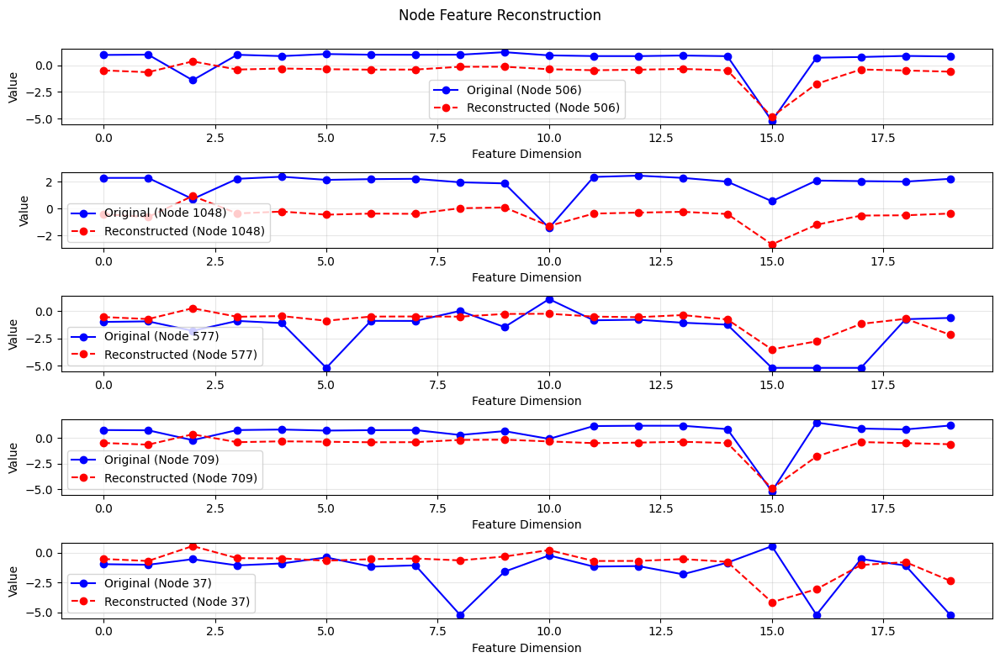

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5564.77it/s]


Completed. Cached 10201 / 10201 points.


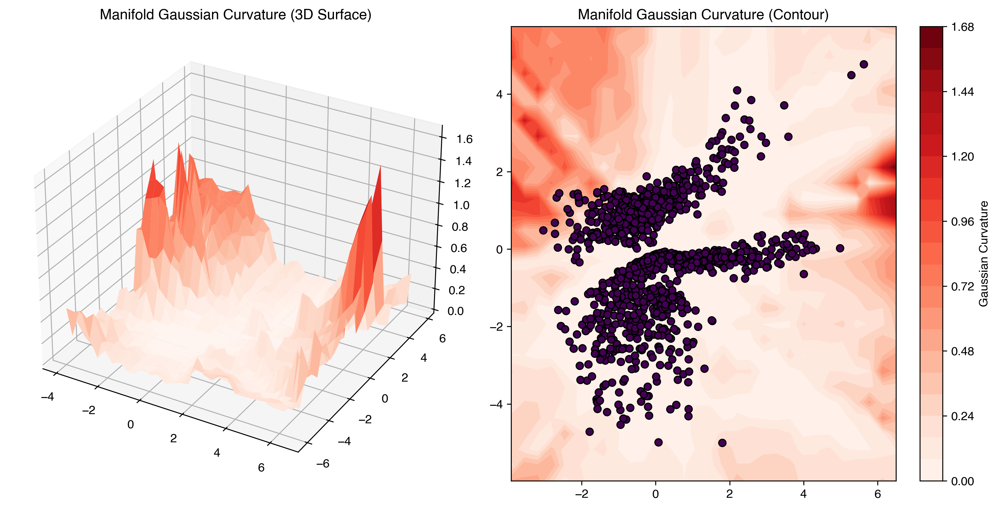

In [10]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

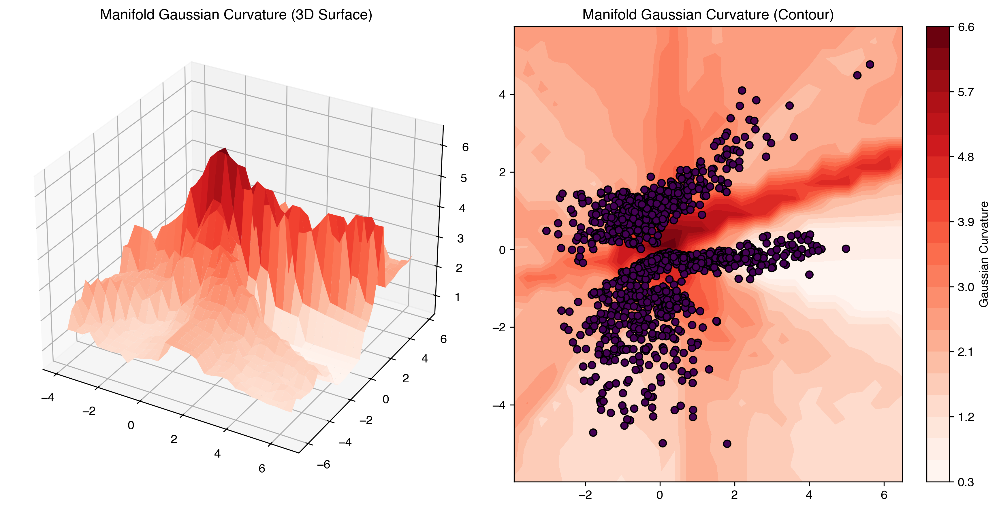

In [11]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

In [12]:
torch.save(model_phase2.state_dict(), 'model_phase2_reducedIDF.pth')

In [13]:
history_phase2.keys()

NameError: name 'history_phase2' is not defined

In [15]:
visualize_training({"recon_loss": history_phase2["recon_loss"], "kl_loss": [], "decoder_losses": {'ref_loss': history_phase2["detailed_losses"]["adj_decoder"]["ref_loss"], 'dyn_loss': history_phase2["detailed_losses"]["adj_decoder"]["base_loss"]}, "total_loss": history_phase2["total_loss"]})


NameError: name 'history_phase2' is not defined

In [16]:
# Combine histories
combined_history = {
    "phase1": history_phase1,
    "phase2": history_phase2
}

merged_history = {}
for key in history_phase1.keys():
  if isinstance(history_phase1[key], list):
    merged_history[key] = history_phase1[key] + history_phase2[key]
  else:
     merged_history[key] = dict()
     #for key2 in history_phase1[key].keys():
        #merged_history[key][key2] = history_phase1[key][key2] + history_phase2[key][key2]
      
     for key2 in history_phase2[key].keys():
        if key2 not in history_phase1[key].keys():
          merged_history[key][key2] = [np.nan]*len(history_phase1["kl_loss"]) + history_phase2[key][key2]

visualize_training(merged_history)


NameError: name 'history_phase1' is not defined

In [17]:
plt.plot(history_phase2["detailed_losses"]["adj_decoder"]["sigma"])

NameError: name 'history_phase2' is not defined

In [18]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )
        

Calculating 800745 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 100094/100094 [00:15<00:00, 6469.78it/s]

Distance matrix calculation complete.


In [19]:
resolution = 30
bounds_np = model_phase1.get_latent_manifold().get_bounds().cpu().numpy()
plot_z1 = np.linspace(bounds_np[0, 0], bounds_np[0, 1], resolution)
plot_z2 = np.linspace(bounds_np[1, 0], bounds_np[1, 1], resolution)

Z1_np, Z2_np = np.meshgrid(plot_z1, plot_z2)
Z1, Z2 = torch.from_numpy(Z1_np), torch.from_numpy(Z2_np)
            
curvature_phase1 = torch.zeros((resolution, resolution))
curvature_phase2 = torch.zeros((resolution, resolution))

            
for i in range(resolution):
    for j in range(resolution):
        z = torch.stack([Z1[i, j], Z2[i, j]])
        clamped_z = model_phase1.get_latent_manifold()._clamp_point_to_bounds(z)
        try:
            curv_val_1 = model_phase1.get_latent_manifold().compute_gaussian_curvature(model_phase1.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase1[i, j] = curv_val_1
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase1[i, j] = torch.nan

        try:
            curv_val_2 = model_phase2.get_latent_manifold().compute_gaussian_curvature(model_phase2.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase2[i, j] = curv_val_2
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase2[i, j] = torch.nan
        

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_19546/3950165761.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax1.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_19546/3950165761.py:41: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax3.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')


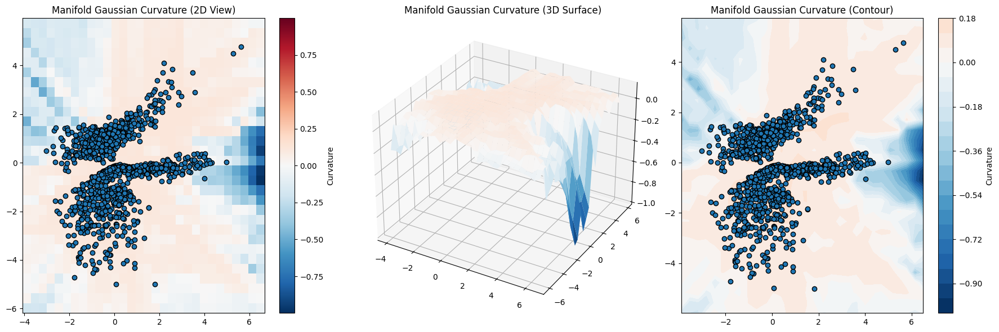

In [20]:
import matplotlib.colors as colors
curvature_diff = (curvature_phase1 - curvature_phase2)/(curvature_phase1 + 1e-8)
curvature_diff = curvature_diff.detach().numpy()

def plot_curv_diff(curvature_diff):
    curvature_diff -= np.mean(curvature_diff)

                
    # --- Plotting Code (using Matplotlib as before) ---
    fig = plt.figure(figsize=(18, 6))
    # ... (The plotting logic is identical, just using the _np versions of arrays)
    vmin, vmax = np.nanmin(curvature_diff), np.nanmax(curvature_diff)
    if np.isnan(vmin) or np.isnan(vmax) or vmin == vmax: vmin, vmax = -1, 1
    if vmin < 0 and vmax > 0:
        absmax = np.max([np.abs(vmax), np.abs(vmin)])
        norm = colors.TwoSlopeNorm(vmin=-absmax, vcenter=0, vmax=absmax)
        cmap = 'RdBu_r'
    elif vmin < 0 and vmax <= 0:
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Blues_r'
    else:
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Reds'

    ax1 = fig.add_subplot(131)
    im = ax1.pcolormesh(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm, shading='auto')
    ax1.set_title('Manifold Gaussian Curvature (2D View)')
    plt.colorbar(im, ax=ax1, label='Curvature')

    ax2 = fig.add_subplot(132, projection='3d')
    ax2.plot_surface(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm)
    ax2.set_title('Manifold Gaussian Curvature (3D Surface)')

    ax3 = fig.add_subplot(133)
    contour = ax3.contourf(Z1_np, Z2_np, curvature_diff, 20, cmap=cmap, norm=norm)
    ax3.set_title('Manifold Gaussian Curvature (Contour)')
    plt.colorbar(contour, ax=ax3, label='Curvature')

    points_np = latent_points.detach().cpu().numpy()
    ax1.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')
    ax3.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')

    plt.tight_layout()
    plt.show()

plot_curv_diff(curvature_diff)


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_19546/3241456288.py:10: RuntimeWarning: invalid value encountered in divide
  res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)


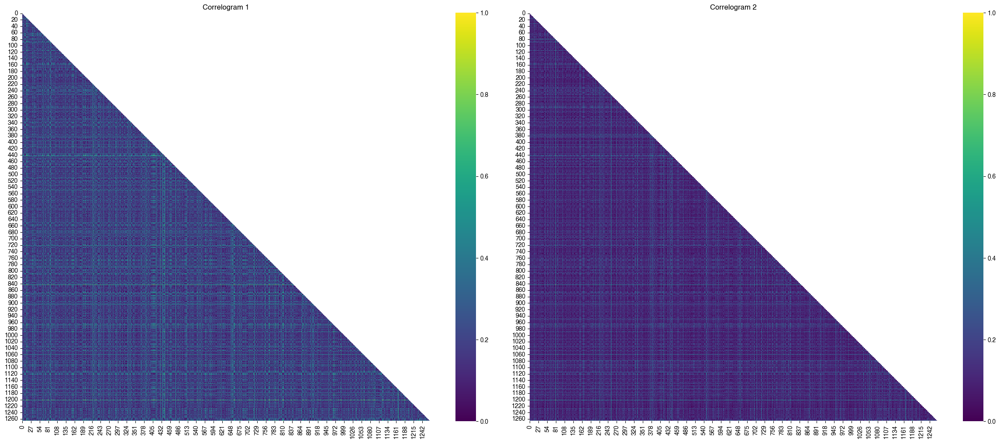

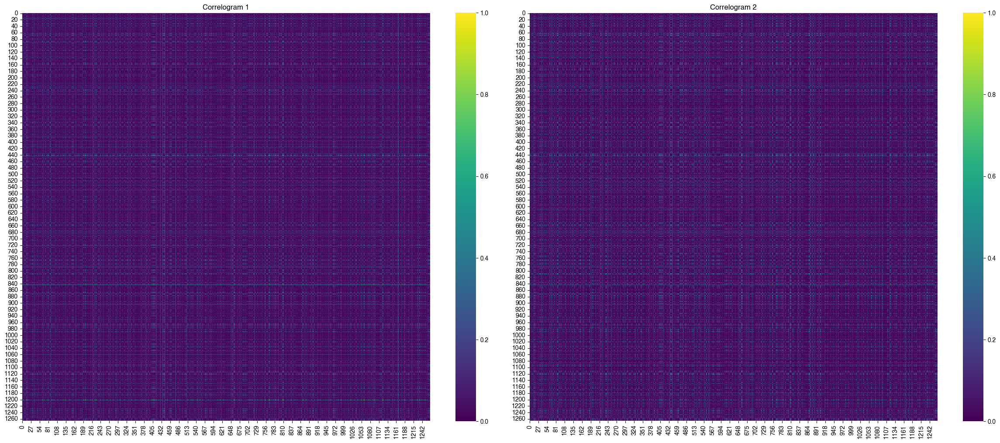

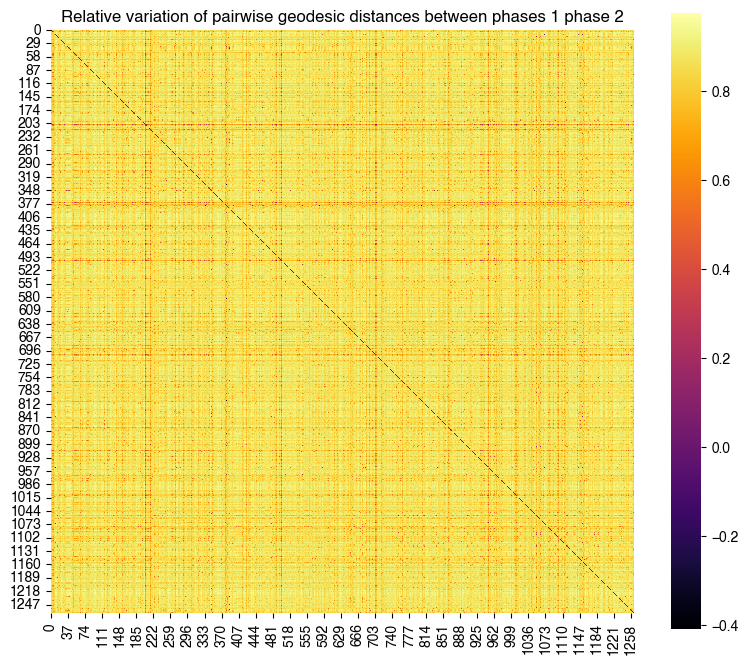

In [21]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
if distance_mode == "dijkstra":
    local_dists_phase1 = dists_phase1_dijkstra.detach().numpy()
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)
#res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)
res3 = np.nan_to_num(res3, 0)

res3_z = (res3 - np.mean(res3))/np.sqrt(np.var(res3))

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

In [22]:
for i in [0,2, 4, 5, 9, 10, 11, 14, 15, 16, 17, 18, 19]:
    print(cols_to_norm[i])

NameError: name 'cols_to_norm' is not defined

In [23]:
x.shape[1]

20

In [24]:
import statsmodels.api as sm

# Knowing that x is:
cols_to_norm = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

x = single_graph.x[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]].numpy()
x = sm.add_constant(x)
y = res3_z.sum(axis=1).flatten()

model = sm.OLS(y,x)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.307
Method:                 Least Squares   F-statistic:                     47.76
Date:                Wed, 22 Oct 2025   Prob (F-statistic):           8.44e-94
Time:                        13:52:34   Log-Likelihood:                -9583.8
No. Observations:                1266   AIC:                         1.919e+04
Df Residuals:                    1253   BIC:                         1.926e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -225.6268     18.899    -11.938      0.0

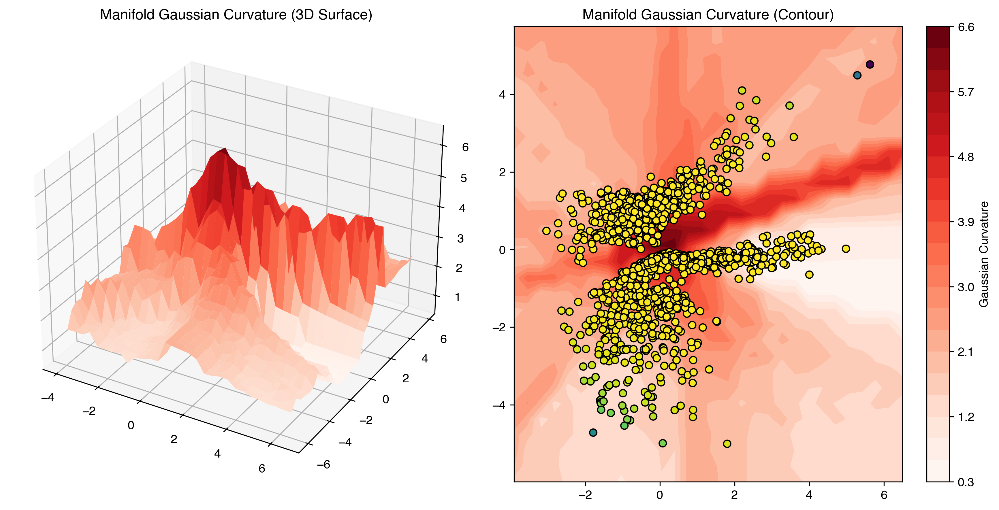

In [ ]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=(torch.tensor(res3.sum(axis=1))))

In [25]:
import numpy as np

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle without diagonal
y_pairs = y[pairs]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant from original x
    # build symmetric regressors
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)
X_pairs = sm.add_constant(X_pairs)

model = sm.OLS(y_pairs, X_pairs)
results = model.fit()
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.206
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     8671.
Date:                Wed, 22 Oct 2025   Prob (F-statistic):               0.00
Time:                        13:52:44   Log-Likelihood:            -9.9597e+05
No. Observations:              800745   AIC:                         1.992e+06
Df Residuals:                  800720   BIC:                         1.992e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6261      0.003   -232.461      0.0

In [26]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.206
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     142.0
Date:                Wed, 22 Oct 2025   Prob (F-statistic):               0.00
Time:                        13:52:55   Log-Likelihood:            -9.9597e+05
No. Observations:              800745   AIC:                         1.992e+06
Df Residuals:                  800720   BIC:                         1.992e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6261    

In [27]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)


                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.2063
Estimator:                        OLS   Adj. R-squared:                 0.2063
No. Observations:              800745   F-statistic:                    1702.2
Date:                Wed, Oct 22 2025   P-value (F-stat)                0.0000
Time:                        13:53:15   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept              -0.6261     0.0531    -11.793     0.0000     -0.7301     -0.5220
p20_pop_sum     

In [28]:
import pandas as pd

def classify_pairwise_regression(results, regressor_names, alpha=0.05):
    """
    Classify pairwise regression coefficients into categories:
    - Convergence drivers
    - Divergence drivers
    - Homophily
    - Heterophily
    Only coefficients with p < alpha are considered significant.
    """

    coef = results.params
    df = pd.DataFrame({
        "regressor": regressor_names,
        "coef": coef,
        "pval": results.pvalues
    })

    # keep only significant variables
    df_sig = df[df["pval"] < alpha]

    categories = {"convergence": [], "divergence": [], "homophily": [], "heterophily": []}

    for _, row in df_sig.iterrows():
        name, c = row["regressor"], row["coef"]

        if name.endswith("_sum"):
            if c > 0:
                categories["convergence"].append((name, c))
            elif c < 0:
                categories["divergence"].append((name, c))

        elif name.endswith("_absdiff"):
            if c > 0:
                categories["heterophily"].append((name, c))
            elif c < 0:
                categories["homophily"].append((name, c))

    # Print with explanations
    print("\nInterpretation of regression results (significant at p < {}):".format(alpha))
    print("• Convergence: positive _sum → larger joint values reduce relative distance.")
    print("• Divergence: negative _sum → larger joint values increase relative distance.")
    print("• Homophily: negative _absdiff → similarity reduces distance.")
    print("• Heterophily: positive _absdiff → dissimilarity reduces distance.\n")

    for cat, vars_ in categories.items():
        if vars_:
            print(f"{cat.capitalize()} drivers:")
            for name, coef in vars_:
                print(f"  - {name}: {coef:.4f}")
            print("")

    return categories, df, df_sig

classify_pairwise_regression(results, regressor_names)


Interpretation of regression results (significant at p < 0.05):
• Convergence: positive _sum → larger joint values reduce relative distance.
• Divergence: negative _sum → larger joint values increase relative distance.
• Homophily: negative _absdiff → similarity reduces distance.
• Heterophily: positive _absdiff → dissimilarity reduces distance.

Convergence drivers:
  - p20_pop_sum: 0.1359
  - p14_pop_sum: 0.0616
  - p20_men_sum: 0.0516
  - naisd22_sum: 0.1220
  - p20_logvac_sum: 0.0379
  - p20_emplt_sum: 0.0121

Divergence drivers:
  - p20_log_sum: -0.2934
  - p20_rp_sum: -0.0692
  - p20_rsecocc_sum: -0.0255

Homophily drivers:
  - decesd22_absdiff: -0.0553
  - med20_absdiff: -0.0385

Heterophily drivers:
  - p20_pop_absdiff: 0.0936
  - p14_pop_absdiff: 0.0655
  - p20_men_absdiff: 0.0316
  - p20_rp_absdiff: 0.0065
  - p20_rsecocc_absdiff: 0.0419
  - p20_logvac_absdiff: 0.0237
  - p20_emplt_absdiff: 0.0511



({'convergence': [('p20_pop_sum', 0.13586437817536742),
   ('p14_pop_sum', 0.06156085424363505),
   ('p20_men_sum', 0.051560573078597405),
   ('naisd22_sum', 0.12198676168457556),
   ('p20_logvac_sum', 0.037878708198966125),
   ('p20_emplt_sum', 0.012081001920003597)],
  'divergence': [('p20_log_sum', -0.2934287436176309),
   ('p20_rp_sum', -0.06919880028082438),
   ('p20_rsecocc_sum', -0.025463469484188907)],
  'homophily': [('decesd22_absdiff', -0.05527654360092254),
   ('med20_absdiff', -0.03853755848870579)],
  'heterophily': [('p20_pop_absdiff', 0.09360865381111876),
   ('p14_pop_absdiff', 0.06549654316900823),
   ('p20_men_absdiff', 0.03161485364819791),
   ('p20_rp_absdiff', 0.006520158808980609),
   ('p20_rsecocc_absdiff', 0.041871796221594114),
   ('p20_logvac_absdiff', 0.023670929009692285),
   ('p20_emplt_absdiff', 0.05105572815090816)]},
               regressor      coef           pval
 0                 const -0.626058   1.397368e-47
 1           p20_pop_sum  0.135864   6

In [30]:
torch.save(model_phase1.state_dict(), 'model_phase1_geo.pth')
torch.save(model_phase2.state_dict(), 'model_phase2_geo.pth')


### Original distances

In [31]:
import numpy as np
import pandas as pd
import statsmodels.api as sm


y = adjacency_matrix
x = p_vectors_array[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]]
x = sm.add_constant(x)
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     5.412
Date:                Wed, 22 Oct 2025   Prob (F-statistic):           1.39e-15
Time:                        13:56:05   Log-Likelihood:             2.8533e+06
No. Observations:              800745   AIC:                        -5.707e+06
Df Residuals:                  800720   BIC:                        -5.706e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0004   5

In [32]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)

                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.0031
Estimator:                        OLS   Adj. R-squared:                 0.0031
No. Observations:              800745   F-statistic:                    115.83
Date:                Wed, Oct 22 2025   P-value (F-stat)                0.0000
Time:                        13:56:17   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               0.0004  7.647e-05     4.8853     0.0000      0.0002      0.0005
p20_pop_sum     

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

class PlotlyNodeViewer:
    def __init__(self, single_graph, model_phase1, latent_points, names):
        self.single_graph = single_graph
        self.model_phase1 = model_phase1
        self.latent_points = latent_points
        self.names = names
        self.num_nodes = len(names)
        
        # Create subplot figure
        self.fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=('Node Reconstruction', 'Points on Manifold - Click to Select'),
            horizontal_spacing=0.1
        )
        
        # Initial selected index
        self.selected_idx = 0
        
        # Add manifold scatter plot
        points_np = self.latent_points.detach().cpu().numpy()
        
        self.fig.add_trace(
            go.Scatter(
                x=points_np[:, 0],
                y=points_np[:, 1],
                mode='markers',
                marker=dict(size=8, color='lightblue', line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(self.names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                name='Nodes'
            ),
            row=1, col=2
        )
        
        # Highlight selected point
        self.fig.add_trace(
            go.Scatter(
                x=[points_np[0, 0]],
                y=[points_np[0, 1]],
                mode='markers',
                marker=dict(size=12, color='red', line=dict(width=2, color='darkred')),
                name='Selected',
                showlegend=False
            ),
            row=1, col=2
        )
        
        # Add initial reconstruction
        self.update_reconstruction(0)
        
        # Set up click callback
        self.fig.data[0].on_click(self.on_click)
        
        # Update layout
        self.fig.update_layout(
            title='Interactive Node Reconstruction Viewer',
            height=500,
            showlegend=True
        )
        
        self.fig.show()
    
    def on_click(self, trace, points, selector):
        """Handle click events on scatter plot"""
        if points.point_inds:
            self.selected_idx = points.point_inds[0]
            
            # Update highlight position
            points_np = self.latent_points.detach().cpu().numpy()
            self.fig.data[1].x = [points_np[self.selected_idx, 0]]
            self.fig.data[1].y = [points_np[self.selected_idx, 1]]
            
            # Update reconstruction
            self.update_reconstruction(self.selected_idx)
    
    def update_reconstruction(self, idx):
        """Update reconstruction plot"""
        # Get original and reconstructed data
        a = self.single_graph.x[idx]
        a_r = self.model_phase1(self.single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        
        # Remove existing reconstruction traces if any
        traces_to_remove = []
        for i, trace in enumerate(self.fig.data):
            if trace.name in ['Original', 'Reconstructed']:
                traces_to_remove.append(i)
        
        for i in reversed(traces_to_remove):
            self.fig.data = self.fig.data[:i] + self.fig.data[i+1:]
        
        # Add new reconstruction traces
        x_vals = list(range(len(original)))
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=original,
                mode='lines+markers',
                name='Original',
                line=dict(color='blue', width=2),
                marker=dict(size=6)
            ),
            row=1, col=1
        )
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=reconstructed,
                mode='lines+markers',
                name='Reconstructed',
                line=dict(color='orange', width=2, dash='dash'),
                marker=dict(size=6, symbol='square')
            ),
            row=1, col=1
        )
        
        # Update subplot title
        self.fig.layout.annotations[0].text = f'Reconstruction: {idx} - {self.names[idx]}'


# Even simpler version using Plotly widgets
def create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names):
    """Simple function-based approach"""
    import ipywidgets as widgets
    from IPython.display import display
    
    def plot_reconstruction(idx):
        # Get data
        a = single_graph.x[idx]
        a_r = model_phase1(single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        points_np = latent_points.detach().cpu().numpy()
        
        # Create subplots
        fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=(f'Reconstruction: {idx} - {names[idx]}', 'Points on Manifold')
        )
        
        # Reconstruction plot
        x_vals = list(range(len(original)))
        fig.add_trace(
            go.Scatter(x=x_vals, y=original, mode='lines+markers', 
                      name='Original', line=dict(color='blue')),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(x=x_vals, y=reconstructed, mode='lines+markers',
                      name='Reconstructed', line=dict(color='orange', dash='dash')),
            row=1, col=1
        )
        
        # Manifold plot with highlight
        colors = ['red' if i == idx else 'lightblue' for i in range(len(points_np))]
        sizes = [12 if i == idx else 8 for i in range(len(points_np))]
        
        fig.add_trace(
            go.Scatter(
                x=points_np[:, 0], y=points_np[:, 1],
                mode='markers',
                marker=dict(size=sizes, color=colors, line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                showlegend=False
            ),
            row=1, col=2
        )
        
        fig.update_layout(height=500, title='Node Reconstruction Viewer')
        fig.show()
    
    # Create slider widget
    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=len(names)-1,
        step=1,
        description='Node:',
        continuous_update=False
    )
    
    # Create interactive widget
    interactive_plot = widgets.interactive(plot_reconstruction, idx=slider)
    display(interactive_plot)
    
    return interactive_plot

# Usage:
# Method 1 - Click-based (more advanced):
#viewer = PlotlyNodeViewer(single_graph, model_phase1, latent_points, names)

# Method 2 - Slider-based (simpler, guaranteed to work):
interactive_plot = create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names)

interactive(children=(IntSlider(value=0, continuous_update=False, description='Node:', max=1265), Output()), _…